# Problem 03
# Mahtab Nejati
# 98209434
## Please download the data from the link below
### https://drive.google.com/drive/folders/1-IwpWHjtZDzpFXUHo5n7M_9ZmMpw_GG5?usp=sharing

In [1]:
import scipy
import numpy as np
from imageio import imread
import matplotlib.pyplot as plt

## Denoise image with specified threshold
### I keep the singular values that satisfy "sum(s[:i+1])/sum(s[:])>=Threshold" . My results might look different because I haven't squared up each singular value in this calculation. The reason is that I wanted to get a more diverse set of results.

In [2]:
def denoiseWithThreshold(img_path,th):
    img = imread(img_path, as_gray=True)
    u, s, vh = np.linalg.svd(img, full_matrices=False)
    sm = np.sum(s)
    s_cleaned = np.array([s[i] if np.sum(s[:i+1])/sm >= th else 0 for i in range(len(s))])
    img_denoised = np.array(np.dot(u * s_cleaned, vh), dtype=int)
    fig = plt.figure()
    fig.suptitle('Denoised with threshold='+str(th)+\
                 '\nRemaining number of components is :'+str(np.count_nonzero(s_cleaned)))
    fig.add_subplot(1, 2, 1)
    fig.set_figwidth(15)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Noisy')
    fig.add_subplot(1, 2, 2)
    plt.imshow(img_denoised)
    plt.axis('off')
    plt.title('Denoised')
    plt.show()

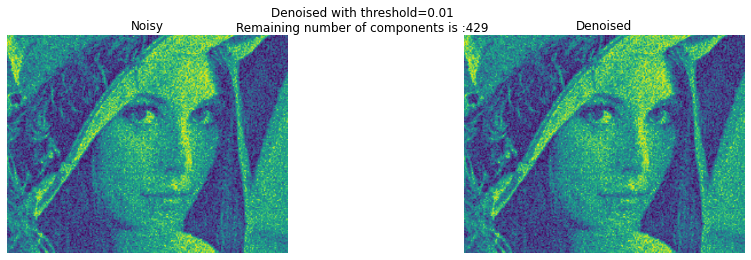

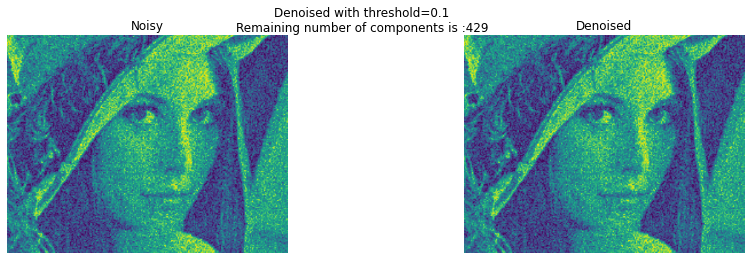

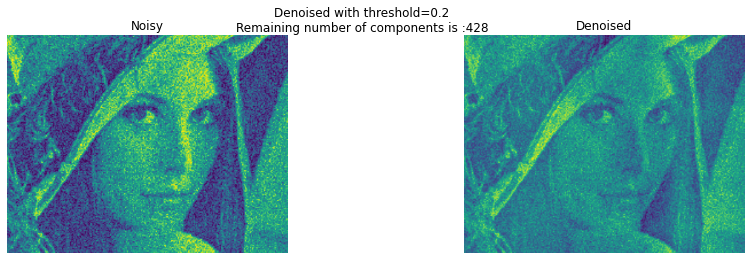

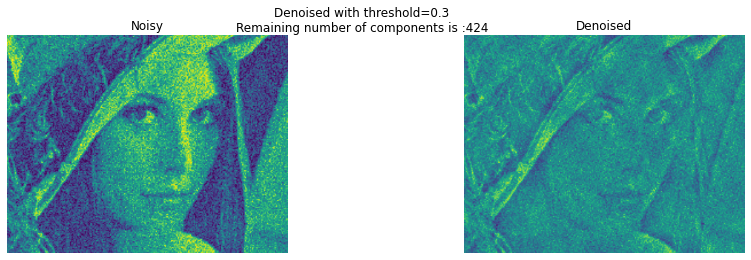

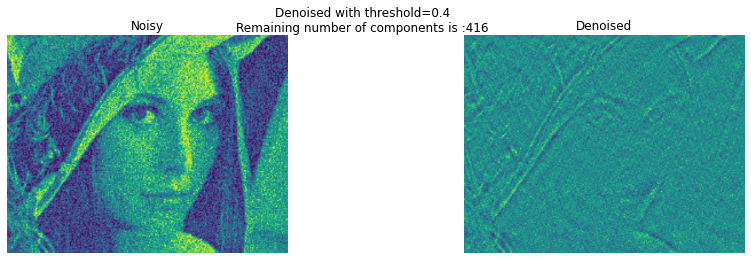

...

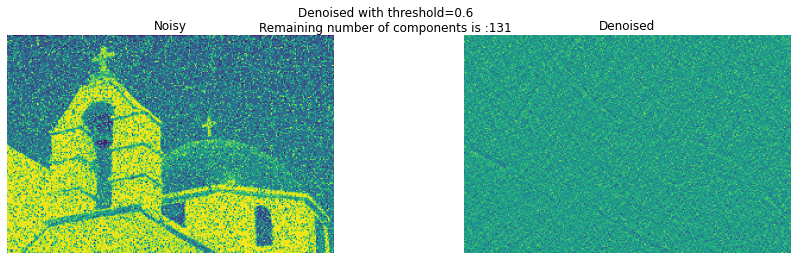

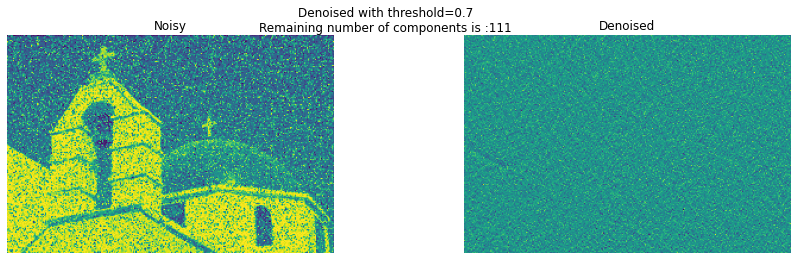

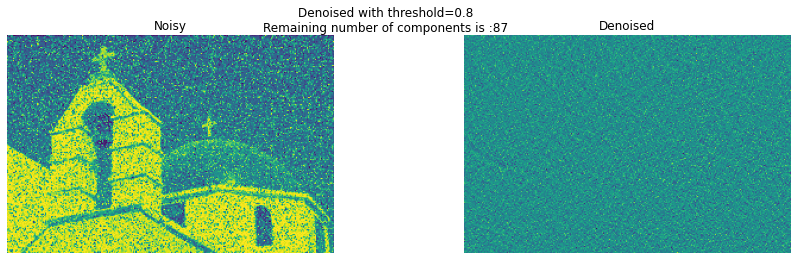

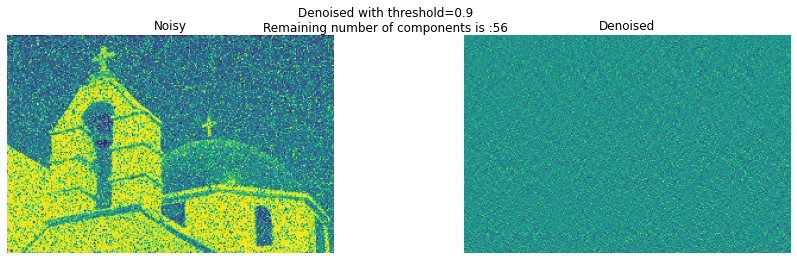

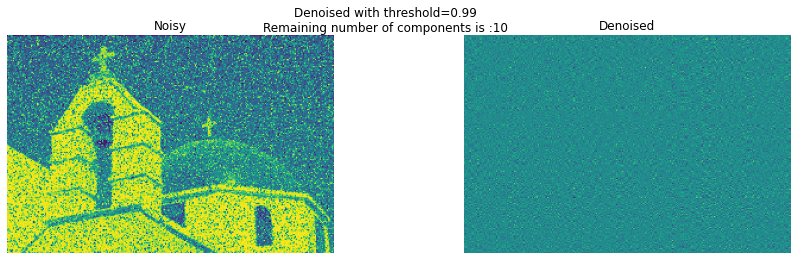

In [3]:
base_dir = "./HW3_P03_Data_MahtabNejati_98209434/"
imgs = ['01.png','02.png','03.png','04.png']
ths = [0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,.99]
for img in imgs:
    for th in ths:
        denoiseWithThreshold(base_dir+img,th)